In [ ]:
%pip install --upgrade pip -q
%pip install -r requirements.txt -q
# Restart the kernel if there is an error

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


Exercice 1 : Clustering - Prédiction des nombres Dans  cet  exercice,  on  souhaite  utiliser  un  algorithme  de  clustering  pour  reconnaitre  des 
nombres écrits à main levé. Pour cela, un dataset labélisé existe déjà et vous permettra ainsi 
d’évaluer simplement la qualité de votre clustering.

1/ En utilisant la fonction load_digit de sklearn, charger le dataset et afficher la forme (shape) 
de celui-ci

In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import load_digits


digits = load_digits()
X_digit, y_digit = digits.data, digits.target
random_state = 42

print(pd.DataFrame(X_digit).shape)

(1797, 64)


2/ En utilisant la fonction imshow de matplotlib, afficher quelques samples du dataset chargé. 
Le titre doit contenir le nombre correspondant à l’image chargée. 

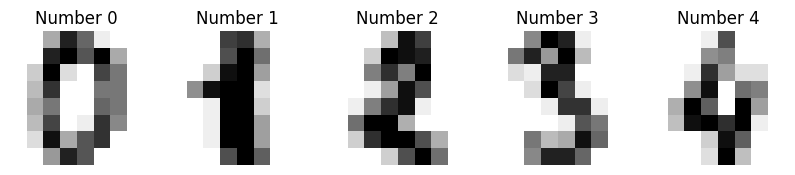

In [3]:
fig, axs = plt.subplots(1, 5, figsize=(10, 5))
for i in range(5):
    axs[i].imshow(X_digit[i].reshape(8, 8), cmap="gray_r")
    axs[i].set_title(f"Number {y_digit[i]}")
    axs[i].axis("off")
plt.show()

3/ En utilisant un des algorithmes vus en cours (KMeans), effectuer un clustering du dataset. 
Quel nombre de cluster doit-on utiliser dans ce cas précis ? 

In [4]:
from sklearn.cluster import KMeans

kmeans = KMeans(10, random_state=random_state).fit(X_digit)
labels = kmeans.labels_

4/ Afficher quelques exemples d’images avec leur label prédit. 

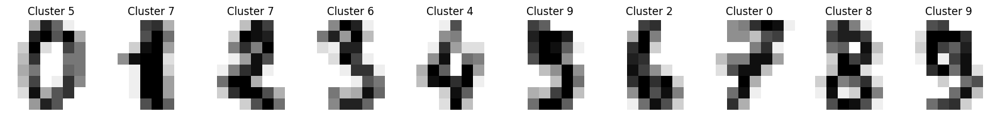

In [5]:
fig, axs = plt.subplots(1, 10, figsize=(16, 16))
axs = axs.flatten()
for i in range(10):
    axs[i].imshow(X_digit[i].reshape(8, 8), cmap="gray_r")
    axs[i].set_title(f"Cluster {labels[i]}")
    axs[i].axis("off")
plt.tight_layout()
plt.show()

5/ Afficher les centres des clusters trouvés

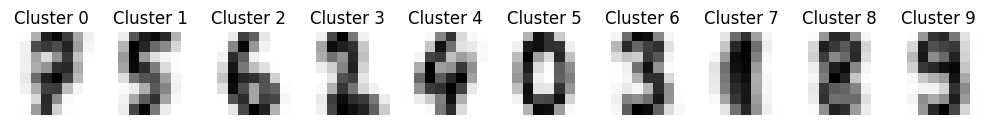

In [6]:
centers = kmeans.cluster_centers_

fig, axs = plt.subplots(1, 10, figsize=(10, 5))

for i in range(10):
    axs[i].imshow(centers[i].reshape(8, 8), cmap="gray_r")
    axs[i].set_title(f"Cluster {i}")
    axs[i].axis("off")

# plt.suptitle("KMeans Cluster Centers Visualized as Digits", fontsize=14)
plt.tight_layout()
plt.show()

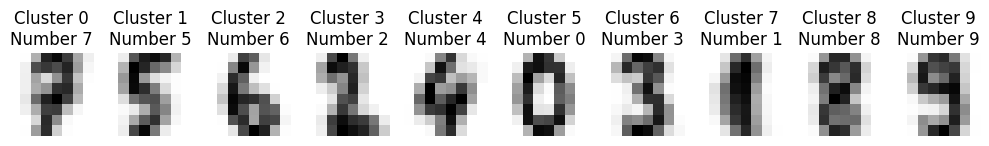

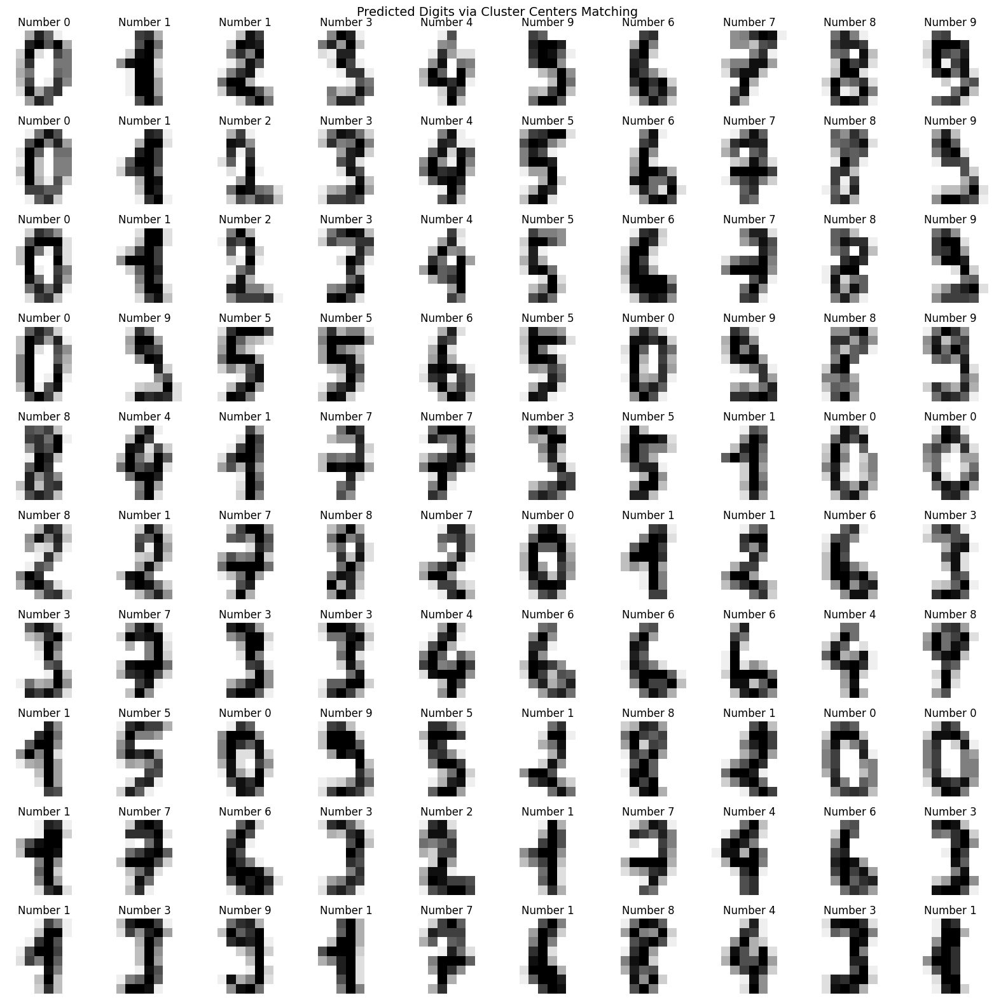

In [7]:
import numpy as np
from sklearn.metrics import pairwise_distances_argmin_min

# 1. 为每个真实数字（0–9）计算它的“平均图像”作为参考原型
digit_prototypes = []
for digit in range(10):
    digit_images = X_digit[y_digit == digit]
    prototype = digit_images.mean(axis=0)  # 求均值图像（64维）
    digit_prototypes.append(prototype)
digit_prototypes = np.array(digit_prototypes)

# 2. 对每个 KMeans 中心，找到最近的真实数字原型
closest_digits, _ = pairwise_distances_argmin_min(
    kmeans.cluster_centers_, digit_prototypes
)

# 3. 构建簇编号 → 真实数字 的映射表
cluster_to_digit_auto = {i: closest_digits[i] for i in range(10)}


fig, axs = plt.subplots(1, 10, figsize=(10, 5))

for i in range(10):
    axs[i].imshow(kmeans.cluster_centers_[i].reshape(8, 8), cmap="gray_r")
    axs[i].set_title(f"Cluster {i}\nNumber {closest_digits[i]}")
    axs[i].axis("off")

# plt.suptitle("KMeans Cluster Centers Visualized as Digits", fontsize=14)
plt.tight_layout()
plt.show()

predicted_digits_auto = np.array([cluster_to_digit_auto[label] for label in labels])

fig, axs = plt.subplots(10, 10, figsize=(16, 16))
axs = axs.flatten()
for i in range(100):
    axs[i].imshow(X_digit[i].reshape(8, 8), cmap="gray_r")
    axs[i].set_title(f"Number {predicted_digits_auto[i]}")
    axs[i].axis("off")
plt.suptitle("Predicted Digits via Cluster Centers Matching", fontsize=14)
plt.tight_layout()
plt.show()

Exercice 2 : Clustering - Recherche du paramètre k optimal

1/ En partant du code de l’exercice 1, écrire une fonction permettant de calculer la moyenne 
des inerties des clusters générés. 

In [8]:
def inertia(data, k):
    kmeans = KMeans(k, random_state=random_state).fit(data)
    return kmeans.inertia_ / data.size

2/  Généraliser  cette  fonction  en  un  code  permettant  de  générer  le  graphe  ci-dessous 
(figure 1)  : il affiche l’inertie du clustering en fonction du nombre de clusters passé en 
paramètre de KMeans. 

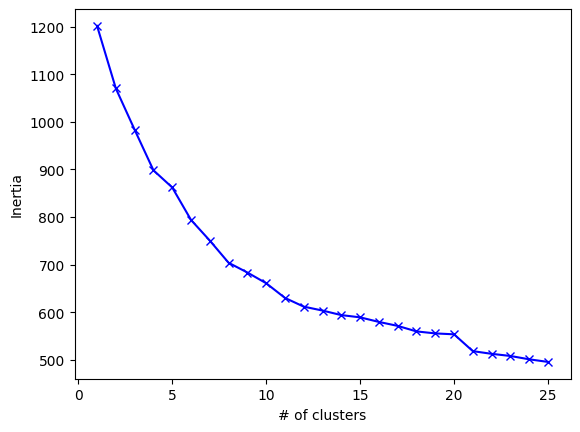

In [9]:
inertias = [
    KMeans(i, random_state=random_state).fit(X_digit).inertia_ / X_digit.shape[0]
    for i in range(1, 26)
]


plt.plot(np.arange(1, 26), inertias, "x-b")


plt.xlabel("# of clusters")


plt.ylabel("Inertia")


plt.show()

3/  Faire  le  même  travail  que  dans  la  question  2  en  calculant  cette  fois  ci  la  distorsion  des 
clusters. 

In [10]:
from scipy.spatial.distance import cdist
from kneed import KneeLocator


def find_best_k(X, n, title="Inertia and Distortion"):
    k_range = range(1, n + 1)
    inertias, distortions = [], []
    for k in k_range:
        kmeans = KMeans(n_clusters=k, random_state=random_state)
        kmeans.fit(X)
        inertia = kmeans.inertia_ / X.shape[0]
        distortion = np.mean(
            np.min(cdist(X, kmeans.cluster_centers_, metric="euclidean") ** 2, axis=1)
        )
        inertias.append(inertia)
        distortions.append(distortion)
    kn = KneeLocator(k_range, inertias, curve="convex", direction="decreasing")
    elbow_k = kn.knee if kn.knee else k_range[-1]

    plt.plot(k_range, inertias, "x-b", label="Inertia", alpha=0.8)
    plt.plot(k_range, distortions, ".-r", label="Distortion", alpha=0.8)
    plt.axvline(elbow_k, color="gray", linestyle="--", label=f"Elbow at k={elbow_k}")
    plt.scatter(elbow_k, inertias[elbow_k - 1], color="red", zorder=5)
    plt.title(title)
    plt.xlabel("# of clusters")
    plt.xticks(k_range)
    plt.legend()
    plt.grid(True)
    plt.figtext(
        0.5,
        0.01,
        "Footnote: Elbow point detected using the Kneedle algorithm (via kneed library).",
        ha="center",
        fontsize=8,
        color="gray",
    )
    plt.tight_layout(rect=(0, 0.03, 1, 1))
    plt.show()

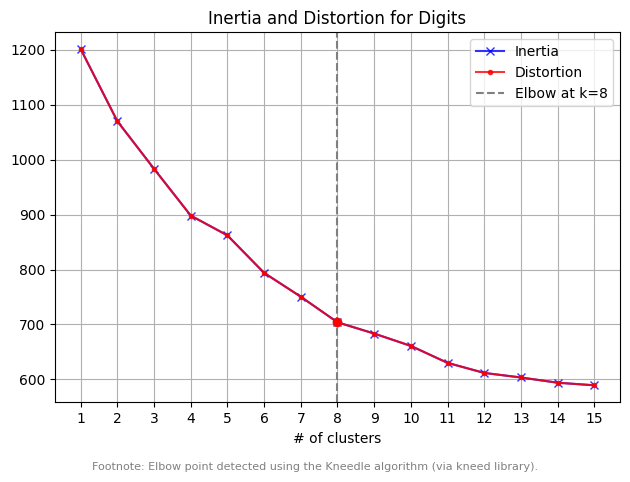

In [11]:
find_best_k(X_digit, 15, title="Inertia and Distortion for Digits")

4/  Utiliser  les  algorithmes  précédemment  développés  pour  trouver  la  meilleure  valeur  du 
paramètre k pour les datasets suivants :

4.a/ Sur un dataset artificiel généré avec des blobs

(1500, 2)


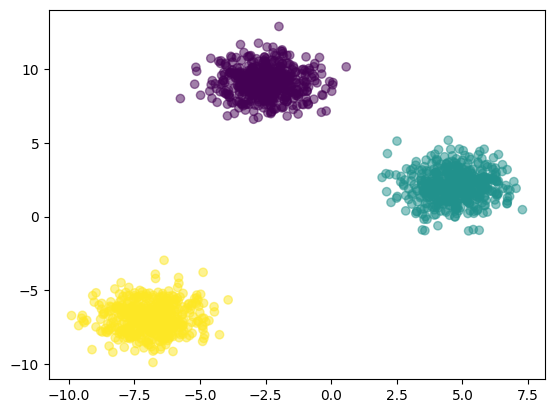

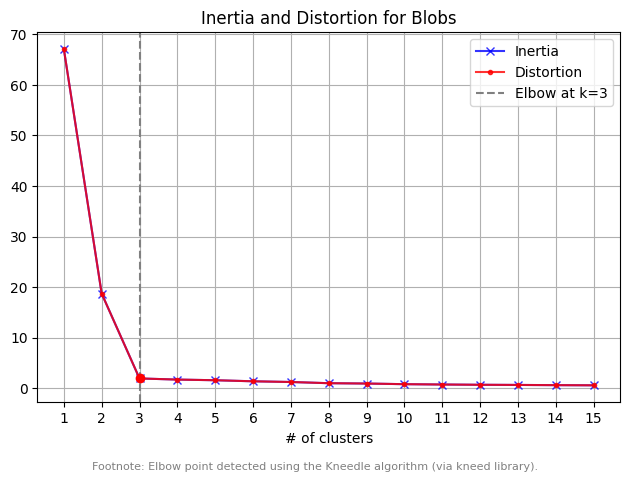

In [12]:
from sklearn.datasets import make_blobs

X_blobs, y_blobs = make_blobs(n_samples=1500, random_state=random_state)
print(X_blobs.shape)

plt.scatter(X_blobs[:, 0], X_blobs[:, 1], c=y_blobs, cmap="viridis", alpha=0.5)
plt.show()

find_best_k(X_blobs, 15, title="Inertia and Distortion for Blobs")

4.b/ Sur le dataset IRIS (voir la fonction load_iris pour cela et explorer le dataset)

(150, 4)


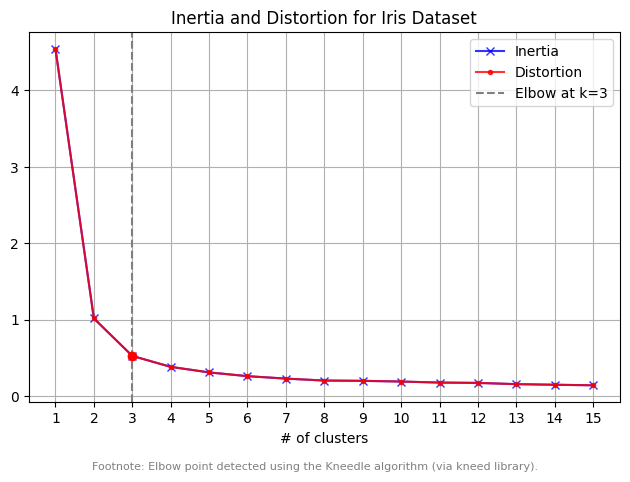

In [13]:
from sklearn.datasets import load_iris

iris = load_iris()
X_iris, y_iris = iris.data, iris.target
print(X_iris.shape)

find_best_k(X_iris, 15, title="Inertia and Distortion for Iris Dataset")

4.c/ Sur le dataset Experience and Salary

(30, 1)


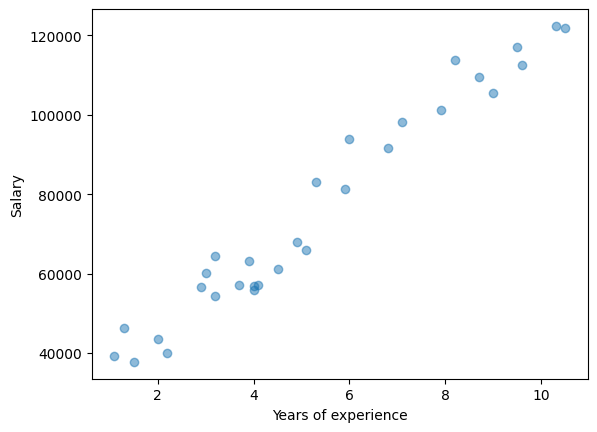

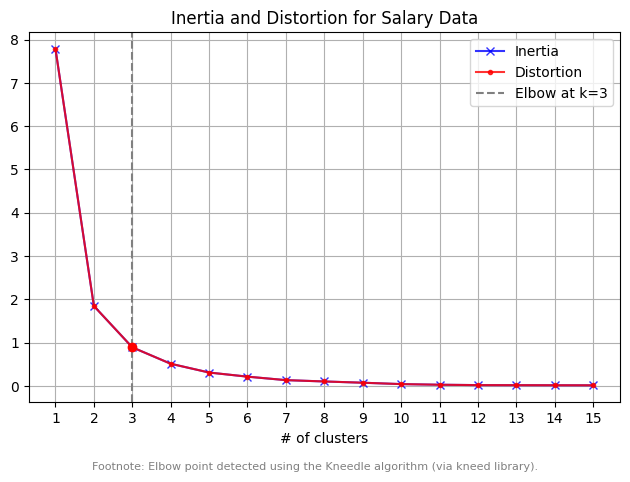

In [14]:
salary = pd.read_csv("Salary_Data.csv")

X_salary, y_salary = salary.iloc[:, :-1], salary.iloc[:, -1]
print(X_salary.shape)

plt.scatter(X_salary, y_salary, alpha=0.5)
plt.xlabel("Years of experience")
plt.ylabel("Salary")
plt.show()

find_best_k(X_salary, 15, title="Inertia and Distortion for Salary Data")

Exercice 3 : Reduction de dimentionalité - Visualisation du dataset IRIS avec PCA 
Dans cet exercice, l’objectif est d’apprendre à utiliser la PCA sur un exemple simple.

1. Charger le dataset IRIS.

In [15]:
X_iris, y_iris = iris.data, iris.target

2. Afficher et analyser le dataset les premières lignes du dataset. Que représente-t-il ?

In [16]:
print(pd.DataFrame(X_iris, columns=iris.feature_names).head())

   sepal length (cm)  sepal width (cm)  petal length (cm)  petal width (cm)
0                5.1               3.5                1.4               0.2
1                4.9               3.0                1.4               0.2
2                4.7               3.2                1.3               0.2
3                4.6               3.1                1.5               0.2
4                5.0               3.6                1.4               0.2


3. Afficher les variables par paire (longueur des sépales vs largeur des pétales, longueur 
des  pétales vs  largeur  des  sépales,  etc.). Chaque  point  doit  être  coloré  par  la  classe 
correspondant au type de fleur.

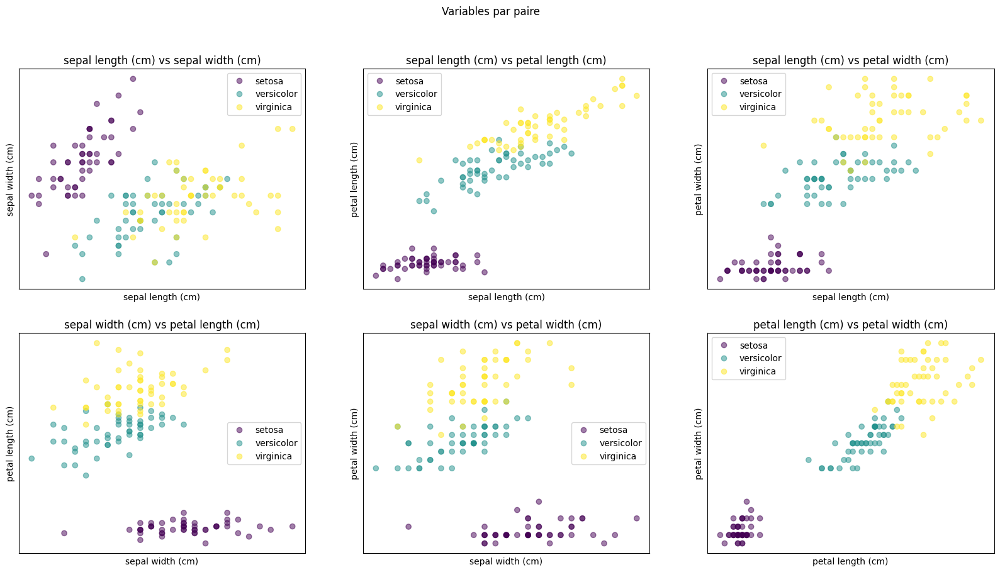

In [17]:
_, axs = plt.subplots(2, 3, figsize=(20, 10))
axs = axs.flatten()

features = iris.feature_names

pairs = [(i, j) for i in range(len(features)) for j in range(i + 1, len(features))]


for i, (a, b) in enumerate(pairs):
    scatter = axs[i].scatter(
        X_iris[:, a],
        X_iris[:, b],
        c=y_iris,
        cmap="viridis",
        alpha=0.5,
    )
    axs[i].set_title(f"{features[a]} vs {features[b]}")

    axs[i].set_xlabel(features[a])
    axs[i].set_ylabel(features[b])

    axs[i].set_xticks([])
    axs[i].set_yticks([])

    handles, _ = scatter.legend_elements()
    axs[i].legend(handles, iris.target_names)


plt.suptitle("Variables par paire")

plt.show()

4. Afficher un pairplot. Que représente-t-il ?

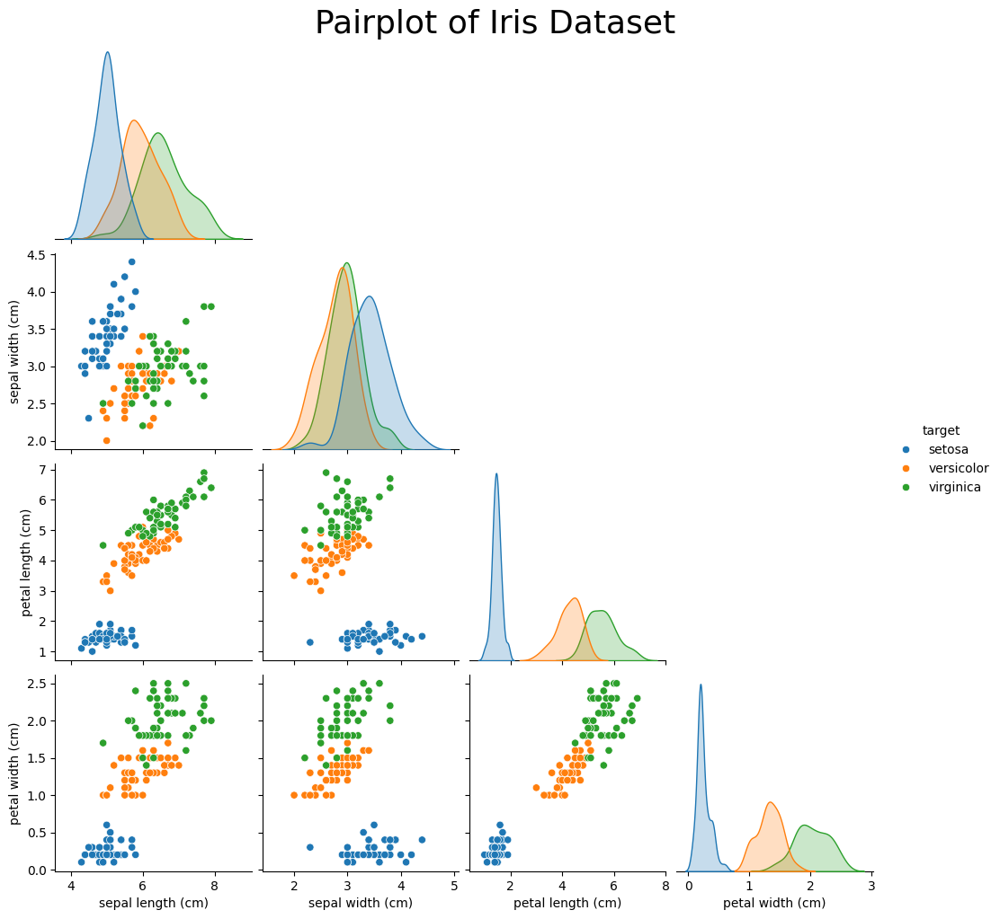

In [18]:
import seaborn as sns


def plot_pairplot(dataset, title="Pairplot"):
    if isinstance(dataset, pd.DataFrame):
        df = dataset.copy()
    else:
        X = dataset.data
        y = dataset.target
        columns = dataset.feature_names
        target_names = dataset.target_names
        df = pd.DataFrame(X, columns=columns)
        df["target"] = target_names[y]

    g = sns.pairplot(df, hue="target", corner=True)
    # There is a known bug in seaborn that causes the pairplot to not display correctly when using the corner=True option.
    width, height = g.figure.get_size_inches()
    fontsize = min(int(((width + height) / 2) * 2.5), 36)
    g.figure.suptitle(title, fontsize=fontsize, y=1.02)
    plt.show()


plot_pairplot(iris, title="Pairplot of Iris Dataset")

5. Calculer et afficher la matrice de corrélation de ce dataset. Que représente-t-elle ? 

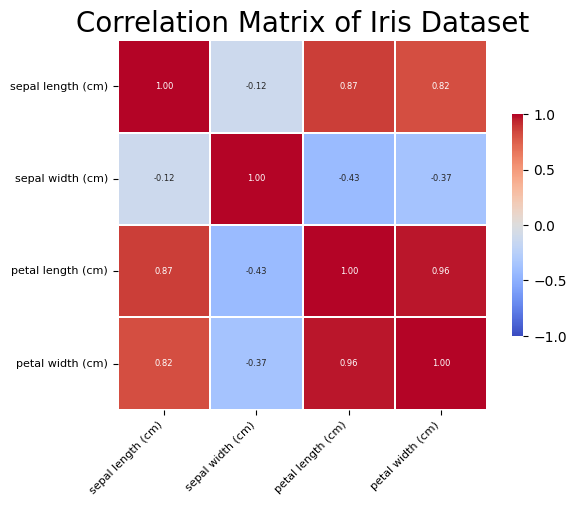

In [19]:
def plot_correlation_matrix(X, columns=None, title="Correlation Matrix"):
    if isinstance(X, pd.DataFrame):
        df = X.copy()
    else:
        if columns is None:
            columns = [f"Feature {i + 1}" for i in range(X.shape[1])]
        df = pd.DataFrame(X, columns=columns)

    sns.heatmap(
        df.corr(),
        vmin=-1,
        vmax=1,
        annot=True,
        fmt=".2f",
        cmap="coolwarm",
        annot_kws={"size": 6},
        square=True,
        linewidths=0.3,
        cbar_kws={"shrink": 0.6},
    )
    plt.title(title, fontsize=20)
    plt.xticks(rotation=45, ha="right", fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.show()


plot_correlation_matrix(
    X_iris, columns=iris.feature_names, title="Correlation Matrix of Iris Dataset"
)

6. Appliquer une PCA vers 2 dimensions au dataset

In [20]:
from sklearn.decomposition import PCA


def plot_PCA(X, y, target_names, dimensions=2, title="PCA"):
    X_reduced = PCA(dimensions).fit_transform(X)
    for i, target_name in enumerate(target_names):
        plt.scatter(
            X_reduced[y == i, 0],
            X_reduced[y == i, 1],
            label=target_name,
            alpha=0.5,
        )

    plt.legend()
    plt.title(title, fontsize=20)
    plt.show()

7. Afficher le résultat de la PCA. Que pensez-vous de la capacité à identifier les types de 
fleurs ?

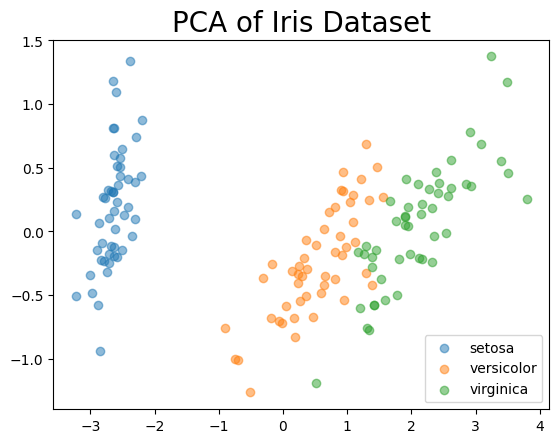

In [21]:
plot_PCA(
    X_iris,
    y_iris,
    iris.target_names,
    title="PCA of Iris Dataset",
)

Exercice 4 : Reduction de dimentionalité - Visualisation du dataset avec 
PCA et t-SNE Dans cet exercice, nous allons comparer différents algorithmes de réduction de 
dimensionnalité, linéaire ou non.

1. Charger le dataset wine. Explorer le dataset. Que représente-t-il ?

In [22]:
from sklearn.datasets import load_wine

wine = load_wine()

X_wine, y_wine = wine.data, wine.target

print(wine.DESCR)

.. _wine_dataset:

Wine recognition dataset
------------------------

**Data Set Characteristics:**

:Number of Instances: 178
:Number of Attributes: 13 numeric, predictive attributes and the class
:Attribute Information:
    - Alcohol
    - Malic acid
    - Ash
    - Alcalinity of ash
    - Magnesium
    - Total phenols
    - Flavanoids
    - Nonflavanoid phenols
    - Proanthocyanins
    - Color intensity
    - Hue
    - OD280/OD315 of diluted wines
    - Proline
    - class:
        - class_0
        - class_1
        - class_2

:Summary Statistics:

============================= ==== ===== ======= =====
                                Min   Max   Mean     SD
============================= ==== ===== ======= =====
Alcohol:                      11.0  14.8    13.0   0.8
Malic Acid:                   0.74  5.80    2.34  1.12
Ash:                          1.36  3.23    2.36  0.27
Alcalinity of Ash:            10.6  30.0    19.5   3.3
Magnesium:                    70.0 162.0    99.7  14.3

2. Afficher les pairplot de ce dataset. Quel est votre analyse ?

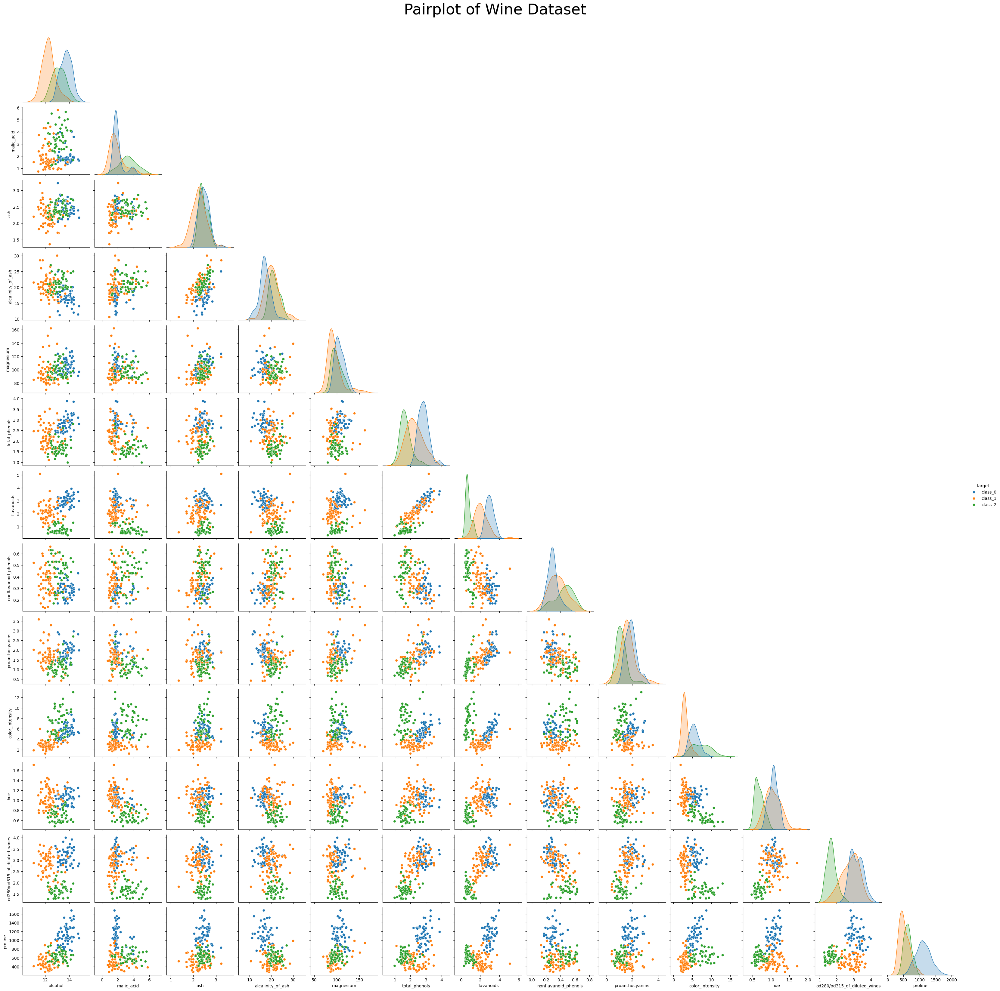

In [23]:
plot_pairplot(wine, title="Pairplot of Wine Dataset")

3. Afficher la matrice de corrélation de ce dataset et l’analyser. 

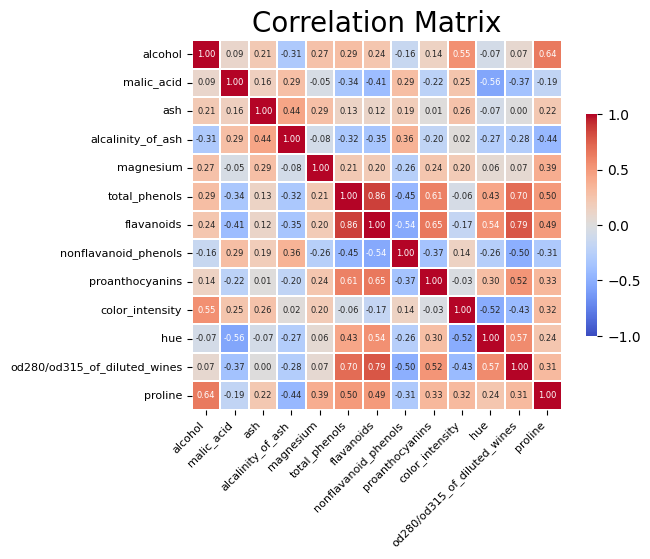

In [24]:
plot_correlation_matrix(X_wine, columns=wine.feature_names)

4. Appliquer une PCA vers 2 dimensions aux datasets

In [25]:
# X_wine_reduced = PCA(2).fit_transform(wine.data)

5. Afficher le résultat de la PCA. Que pensez-vous de la capacité des algorithmes linéaires 
à prédire les classes ?

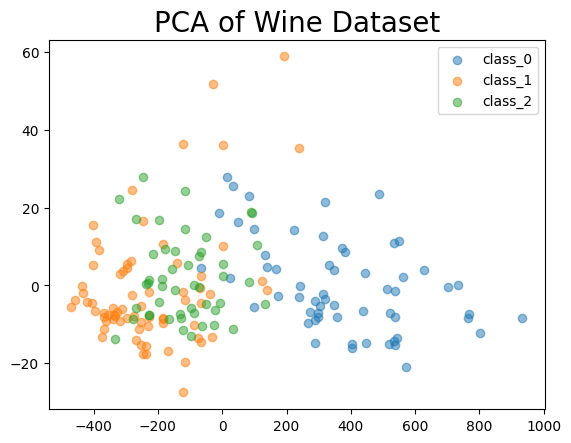

In [26]:
plot_PCA(
    X_wine,
    y_wine,
    wine.target_names,
    title="PCA of Wine Dataset",
)

6. Appliquer une t-SNE vers 2 dimensions sur le dataset en faisant varier la perplexité

In [27]:
from sklearn.manifold import TSNE

# X_wine_reduced = TSNE().fit_transform(wine.data)


def plot_tSNE(X, y, target_names, dimensions=2, title="t-SNE"):
    X_reduced = TSNE(dimensions).fit_transform(X)
    for i, target_name in enumerate(target_names):
        plt.scatter(
            X_reduced[y == i, 0],
            X_reduced[y == i, 1],
            label=target_name,
            alpha=0.5,
        )
    plt.legend()
    plt.title(title, fontsize=20)
    plt.show()

7. Afficher le résultat de la t-SNE. Que pensez-vous de la capacité des algorithmes non-
linéaires à prédire les classes ?

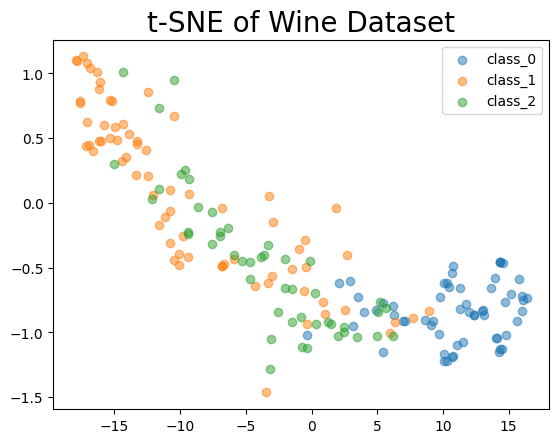

In [28]:
plot_tSNE(
    X_wine,
    y_wine,
    wine.target_names,
    title="t-SNE of Wine Dataset",
)

8. Tester l’algorithme UMap

C:\Users\zhubo\AppData\Roaming\Python\Python311\site-packages\sklearn\utils\deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


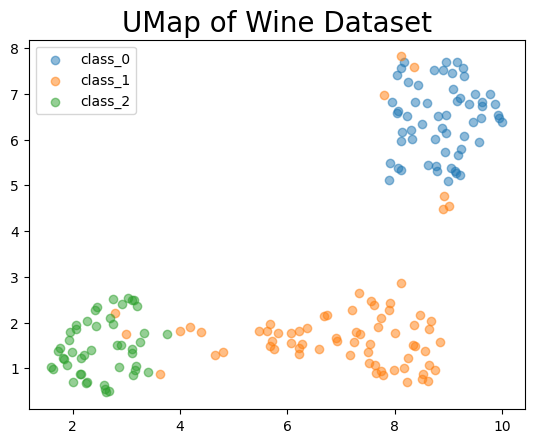

In [29]:
import umap.umap_ as umap
from sklearn.preprocessing import StandardScaler


def plot_UMap(X, y, target_names, dimensions=2, title="UMAP"):
    X_scaled = StandardScaler().fit_transform(X)
    X_scaled_reduced = umap.UMAP(
        n_components=dimensions,
        n_jobs=1,
        random_state=random_state,
    ).fit_transform(X_scaled)
    for i, target_name in enumerate(target_names):
        plt.scatter(
            X_scaled_reduced[y == i, 0],
            X_scaled_reduced[y == i, 1],
            label=target_name,
            alpha=0.5,
        )
    plt.legend()
    plt.title(title, fontsize=20)
    plt.show()


plot_UMap(
    X_wine,
    y_wine,
    wine.target_names,
    title="UMap of Wine Dataset",
)

9. Refaire les questions de 1 à 6 avec le dataset breast_cancer.

In [30]:
from sklearn.datasets import load_breast_cancer

breast_cancer = load_breast_cancer()

X_breast, y_breast = breast_cancer.data, breast_cancer.target

In [31]:
plot_pairplot(breast_cancer, title="Pairplot of Breast Cancer Dataset")

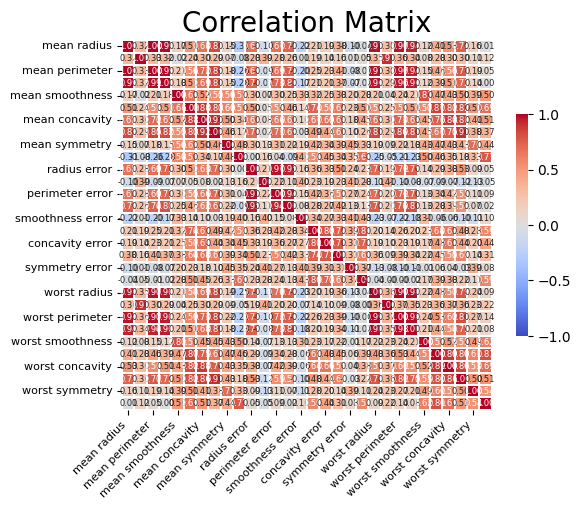

In [32]:
plot_correlation_matrix(X_breast, columns=breast_cancer.feature_names)

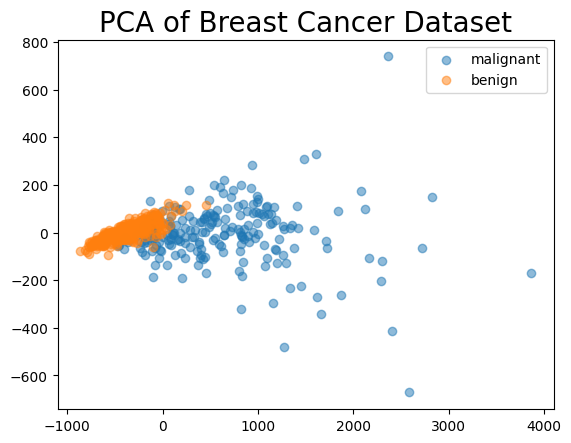

In [33]:
plot_PCA(
    X_breast,
    y_breast,
    breast_cancer.target_names,
    title="PCA of Breast Cancer Dataset",
)

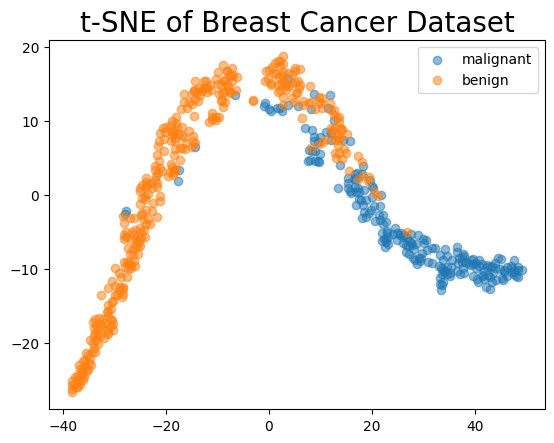

In [34]:
plot_tSNE(
    X_breast,
    y_breast,
    breast_cancer.target_names,
    title="t-SNE of Breast Cancer Dataset",
)

Exercice 5 : Clustering - Autres méthodes de clustering

1/ En utilisant la fonction make_classification, générer un dataset artificiel contenant 2 ou 3 
caractéristiques (pour que le dataset soit affichable sur un graphe), 2 classes avec 1 cluster 
par classe et 1000 exemples.

(1000, 3)


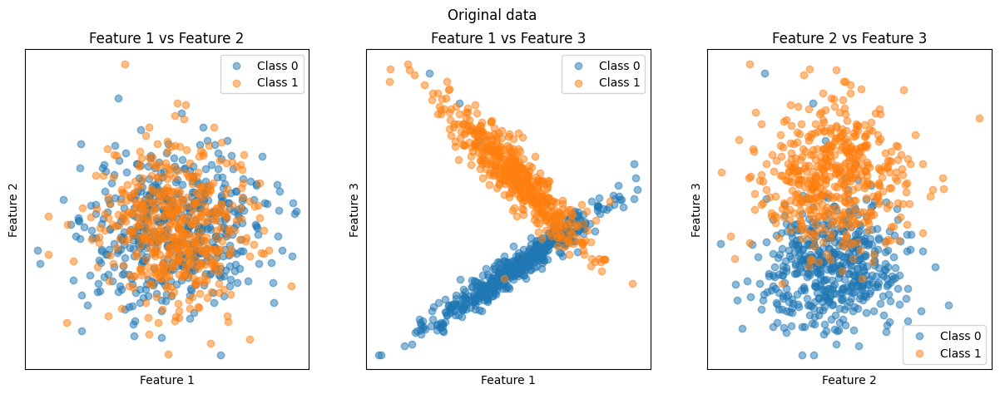

In [35]:
from sklearn.datasets import make_classification

X_made, y_made = make_classification(
    n_samples=1000,
    n_features=3,
    n_redundant=0,
    n_classes=2,
    n_clusters_per_class=1,
    random_state=random_state,
)
print(X_made.shape)

_, axs = plt.subplots(1, 3, figsize=(15, 5))
features = [f"Feature {i + 1}" for i in range(X_made.shape[1])]
pairs = [(i, j) for i in range(len(features)) for j in range(i + 1, len(features))]
for i, (a, b) in enumerate(pairs):
    ax = axs[i]
    for label in np.unique(y_made):
        mask = y_made == label
        ax.scatter(X_made[mask, a], X_made[mask, b], label=f"Class {label}", alpha=0.5)
    ax.set_title(f"{features[a]} vs {features[b]}")
    ax.set_xlabel(features[a])
    ax.set_ylabel(features[b])
    ax.set_xticks([])
    ax.set_yticks([])
    ax.legend()

plt.suptitle("Original data")
plt.show()

2/ Explorer, analyser et tester les algorithmes de clustering suivants

2.a/ KMeans

In [36]:
def cluster_algo(algo, X, features=None):
    if features is None:
        features = [f"Feature {i + 1}" for i in range(X.shape[1])]
    pairs = [(i, j) for i in range(len(features)) for j in range(i + 1, len(features))]

    labels = algo.fit_predict(X)

    _, axs = plt.subplots(1, 3, figsize=(15, 5))

    for i, (a, b) in enumerate(pairs):
        ax = axs[i]
        for label in np.unique(labels):
            mask = labels == label
            ax.scatter(
                X[mask, a],
                X[mask, b],
                label=f"Cluster {label}",
                alpha=0.5,
            )
        ax.set_title(f"{features[a]} vs {features[b]}")
        ax.set_xlabel(features[a])
        ax.set_ylabel(features[b])
        ax.set_xticks([])
        ax.set_yticks([])

        if hasattr(algo, "cluster_centers_"):
            axs[i].scatter(
                algo.cluster_centers_[:, a],
                algo.cluster_centers_[:, b],
                c="black",
                s=50,
                alpha=0.8,
                label="Centers",
            )
        ax.legend()

    plt.suptitle(type(algo).__name__)
    plt.show()

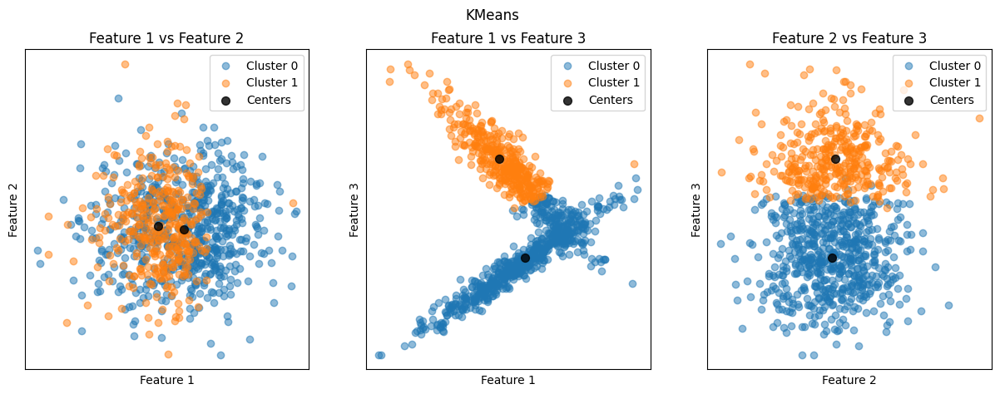

In [37]:
cluster_algo(KMeans(n_clusters=2, random_state=random_state), X_made)

2.b/ DBScan (Density-Based Spatial Clustering of Application and Noise)

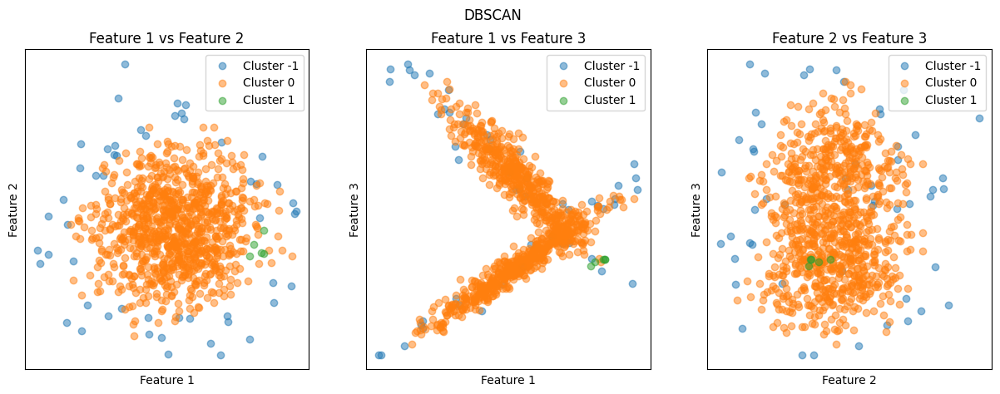

In [38]:
from sklearn.cluster import DBSCAN

cluster_algo(DBSCAN(0.5), X_made)

2.c/ GMM (Gaussian Mixture Model)

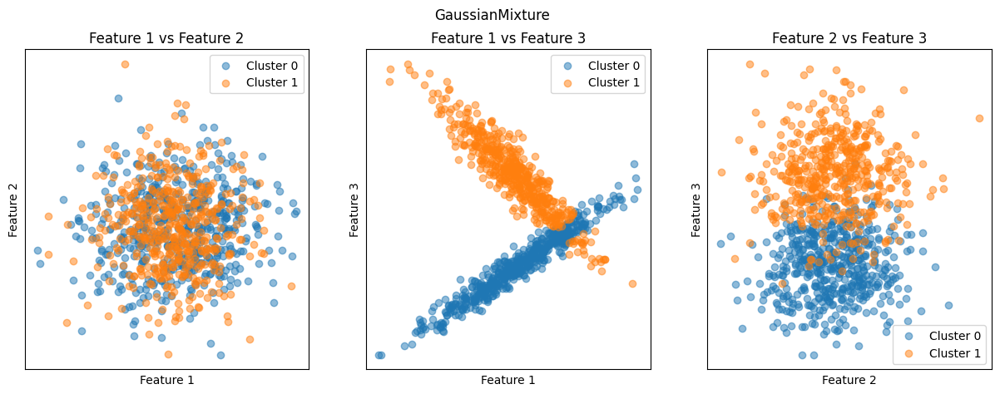

In [39]:
from sklearn.mixture import GaussianMixture

cluster_algo(GaussianMixture(2, random_state=random_state), X_made)

Exercice 6 : Reduction de dimentionalité - Débruitage de données avec 
PCA Dans cet exercice, nous allons voir comment utiliser une PCA pour réduire le bruit dans des 
données, ici une image afin que ce soit visuel. 

1. Charger le dataset MNist

In [40]:
digits = load_digits()

X_digit, y_digit = digits.data, digits.target

2. Afficher quelques images de ce dataset.

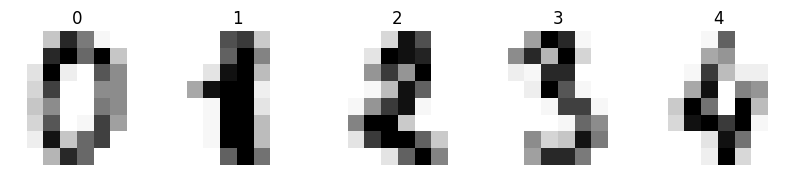

In [41]:
fig, axs = plt.subplots(1, 5, figsize=(10, 5))
plt.set_cmap("Grays")


for i in range(5):
    axs[i].imshow(X_digit[i].reshape(8, 8))
    axs[i].set_title(y_digit[i])
    axs[i].axis("off")


plt.show()

3. En  utilisant  la  fonction  random.normal()  de  numpy,  appliquer  à  chaque  pixel  de 
chaque  image  du  dataset  un  bruit  gaussien.  Garder  ce  nouveau  dataset  dans  une 
nouvelle variable et afficher quelques images.

In [42]:
X_digit_noised = [_ + np.random.normal(size=64) for _ in X_digit]

4. En faisant varier le nombre de dimension de l’espace de projection : 

a. Appliquer une PCA sur le dataset bruité.

In [43]:
pca = PCA(32, random_state=random_state)

pca.fit(X_digit_noised)

PCA(n_components=32, random_state=42)

b. En utilisant  la fonction inverse_transform() de la PCA, revenir à l’image 
d’origine.

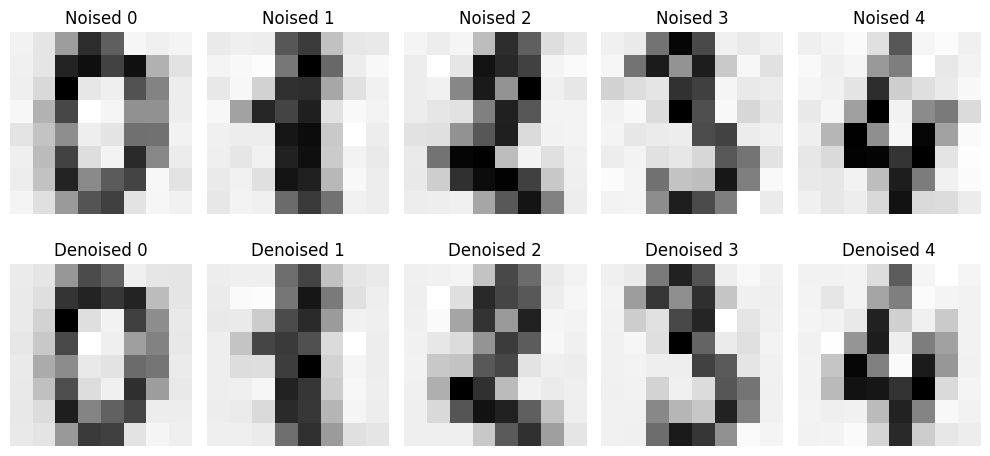

In [44]:
X_digit_denoised = pca.inverse_transform(pca.transform(X_digit_noised))

fig, axs = plt.subplots(2, 5, figsize=(10, 5))
axs = axs.flatten()

for i in range(5):
    axs[i].imshow(X_digit_noised[i].reshape(8, 8))
    axs[i].set_title(f"Noised {y_digit[i]}")
    axs[i].axis("off")

for i in range(5):
    axs[i + 5].imshow(X_digit_denoised[i].reshape(8, 8))
    axs[i + 5].set_title(f"Denoised {y_digit[i]}")
    axs[i + 5].axis("off")

plt.tight_layout()
plt.show()